# Install dependencies

In [1]:
!pip install --upgrade tifffile imagecodecs

In [2]:
!pip install stardist

  Using cached stardist-0.9.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.1 MB)
  Using cached csbdeep-0.8.0-py2.py3-none-any.whl (71 kB)


In [2]:
!pip install csbdeep

# Import the **libraries**

In [3]:
import os
import numpy as np
from tifffile import imread, imwrite
from stardist.models import StarDist2D
from stardist.data import test_image_nuclei_2d
from stardist.plot import render_label
from csbdeep.utils import normalize
import matplotlib.pyplot as plt
import skimage.io
from skimage.io import imsave, imread
from skimage.color import rgb2gray

In [4]:
# prints a list of available models
StarDist2D.from_pretrained()

There are 4 registered models for 'StarDist2D':

Name                  Alias(es)
────                  ─────────
'2D_versatile_fluo'   'Versatile (fluorescent nuclei)'
'2D_versatile_he'     'Versatile (H&E nuclei)'
'2D_paper_dsb2018'    'DSB 2018 (from StarDist 2D paper)'
'2D_demo'             None


In [5]:
input = r'/content/drive/MyDrive/segmentation/original'
output = r'/content/drive/MyDrive/segmentation/output'

# Load the pre-trained StarDist model

In [6]:
# Load the pre-trained StarDist model
model = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
5320433/5320433 [==============================] - 0s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


# Segmentation the images

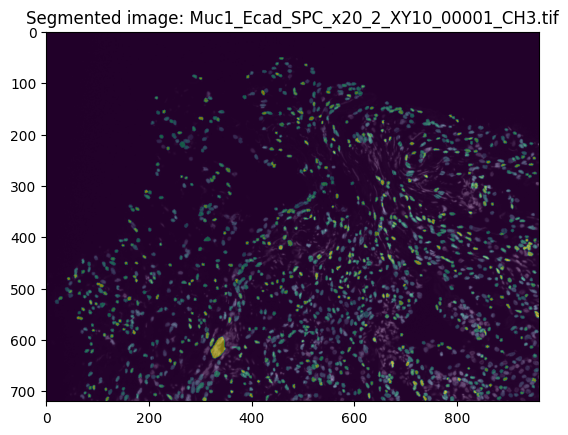

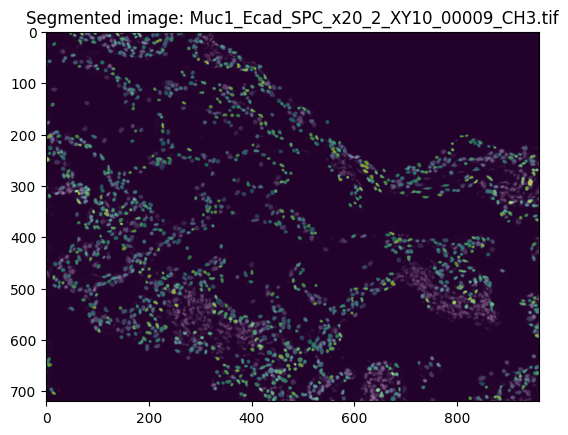

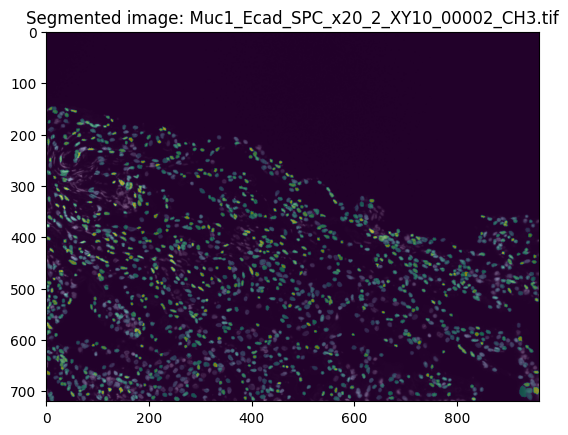

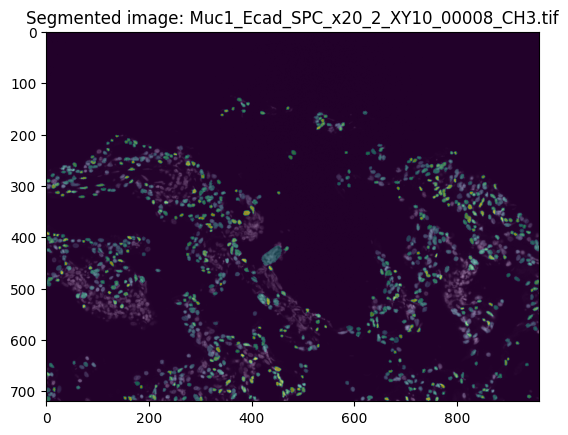

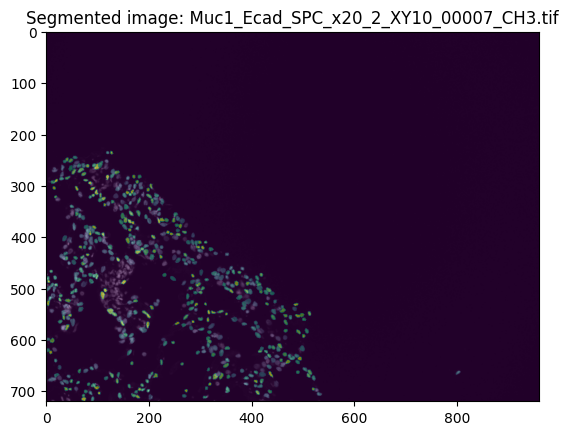

...

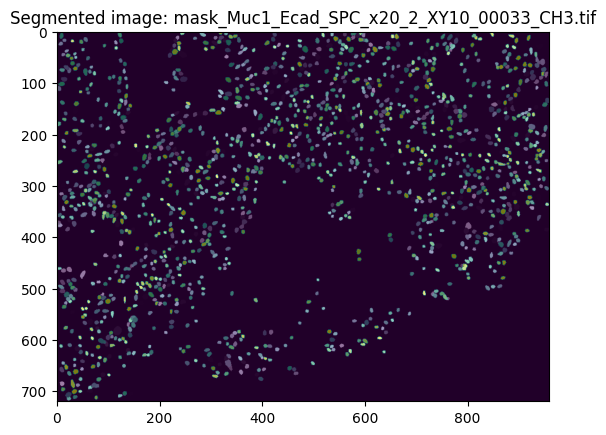

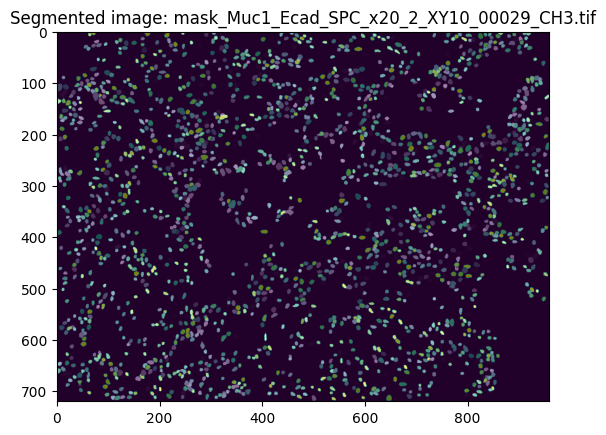

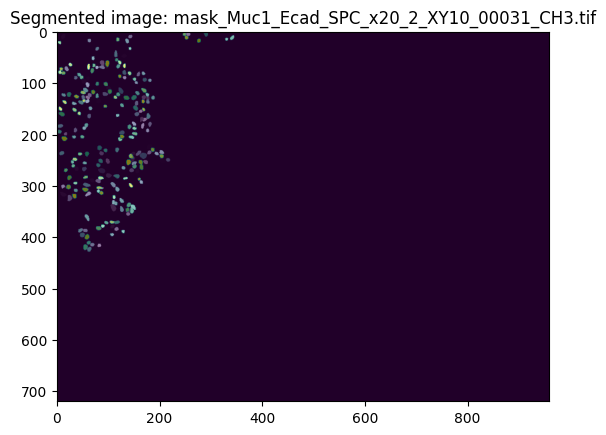

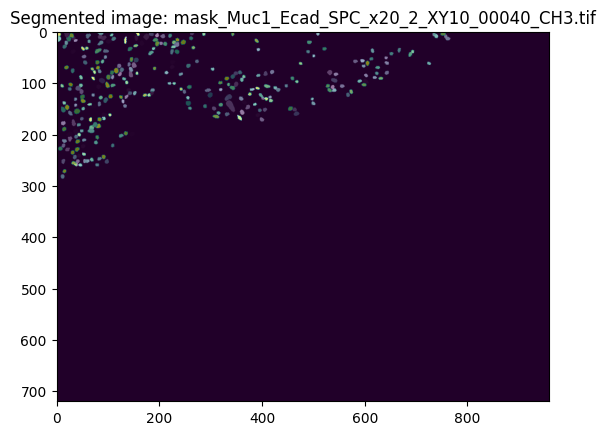

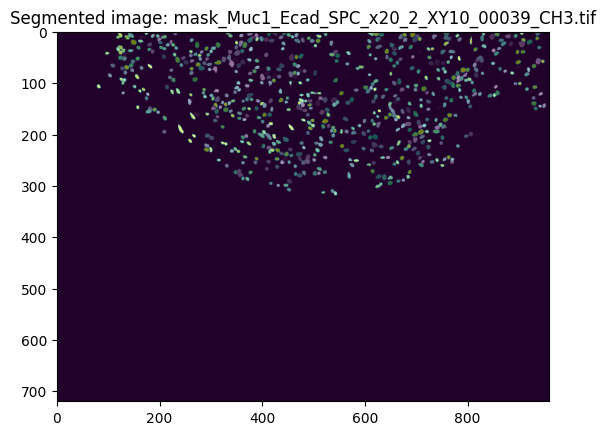

Segmentation completed and masks are saved in the output folder.


In [7]:
for filename in os.listdir(input):
    if filename.endswith('.tif') or filename.endswith('.png') or filename.endswith('.jpg'):
        image_path = os.path.join(input, filename)
        image = imread(image_path, as_gray=True)

        # Convert to grayscale if the image is in RGB
        if image.ndim == 3:
            image = rgb2gray(image)

        # Normalize the image
        image = normalize(image, 1, 99.8, axis=(0, 1))

        # Perform nuclei segmentation
        labels, _ = model.predict_instances(image)

        # Save the labeled mask
        output_path = os.path.join(output, f"mask_{filename}")
        imwrite(output_path, labels.astype(np.uint16))

        plt.imshow(image, cmap='gray')
        # Overlay labels with transparency
        plt.imshow(labels, cmap='viridis', alpha=0.5)
        plt.title(f'Segmented image: {filename}')
        plt.show()


print("Segmentation completed and masks are saved in the output folder.")

In [14]:
from skimage import io

In [15]:
my_img = io.imread(r"/content/drive/MyDrive/segmentation/output_folder/mask_Muc1_Ecad_SPC_x20_2_XY10_00002_CH3.tif")

(-0.5, 959.5, 719.5, -0.5)

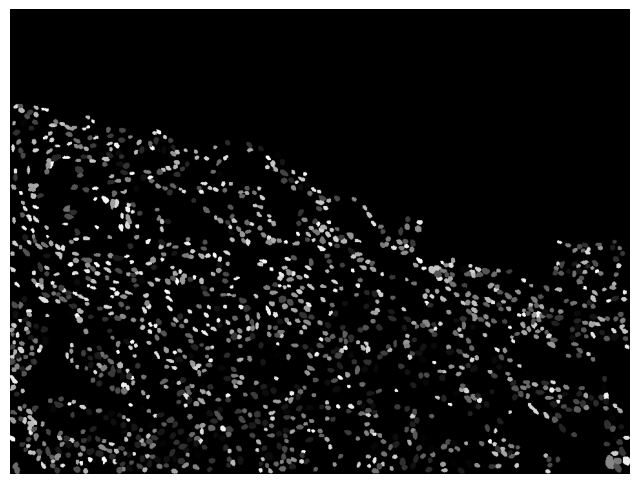

In [17]:
plt.figure(figsize=(8,8))
plt.imshow(my_img, cmap='gray')
plt.axis('off')


In [21]:
my_img_norm = normalize(my_img, 1,99.8, axis=(0,1))
segmented_img, details_img = model.predict_instances(my_img_norm, verbose=True)

predicting instances with nms_thresh = 0.3
non-maximum suppression...
keeping 1347/6752 polyhedra
NMS took 0.1680 s


In [23]:
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
lbl_cmap = random_label_cmap()

(-0.5, 959.5, 719.5, -0.5)

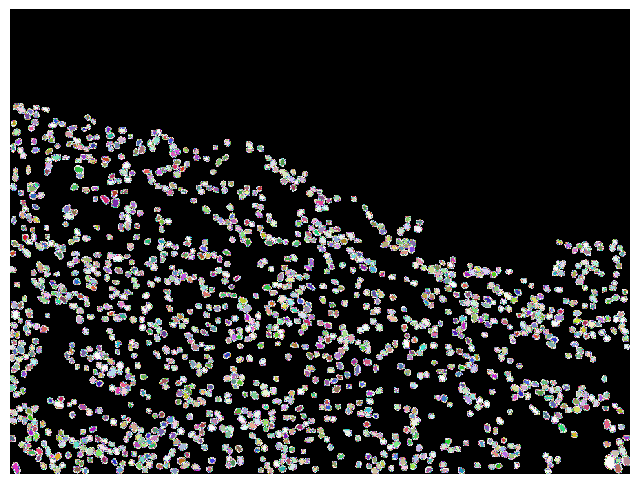

In [24]:
plt.figure(figsize=(8,8))
#plt.imshow(my_img_norm if my_img_norm.ndim==2 else my_img_norm[...,0], clim=(0,1), cmap='gray')
plt.imshow(segmented_img, cmap=lbl_cmap, alpha=1)
plt.axis('off')